## 高度な画像認識の実装と学習

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.autograd as autograd
import torch.nn.functional as F
from torchvision import datasets, transforms, models


import matplotlib.pyplot as plt

from sklearn.utils import shuffle
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

rng = np.random.RandomState(1234)
random_state = 42


## 1. CIFAR-10データセットの読み込みと可視化

In [2]:
batch_size = 1  # 可視化の際に扱いやすくするために1とする．

# データの読み込み
# transforms.ToTensr: 入力データ（np.ndarrayなど）をPyTorchのテンソルに変換する．PyTorchで画像を扱うときは(バッチサイズ，チャネル数，高さ，幅）になるため注意．
dataloader_train = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=False
)

Files already downloaded and verified


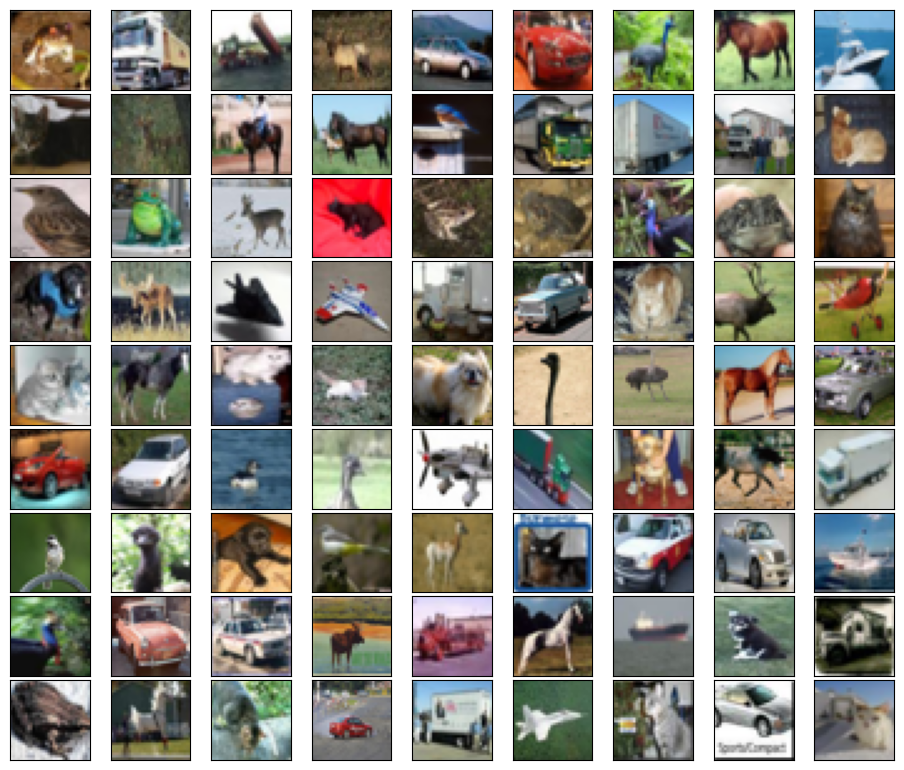

In [3]:
fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

# データセットの画像を可視化
i = 0
for x, _ in dataloader_train:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x)
    i += 1
    if i >= 81:
        break

## 2. Data Augmentation

- Flipping (horizontally)
- Random rotation
- Random cropping
- Random erasing
- Brightness,Contrast,Saturatioin
- Mixup
-...


データ拡張は汎化性能を高くするために訓練時には適用しますが，性能評価の際には利用しないことに注意。

Torchvisionで提供されているデータ拡張ドキュメント: https://pytorch.org/vision/stable/transforms.html

### 2.1. Flipping (horizontally)
Reference: https://pytorch.org/vision/main/generated/torchvision.transforms.RandomHorizontalFlip.html

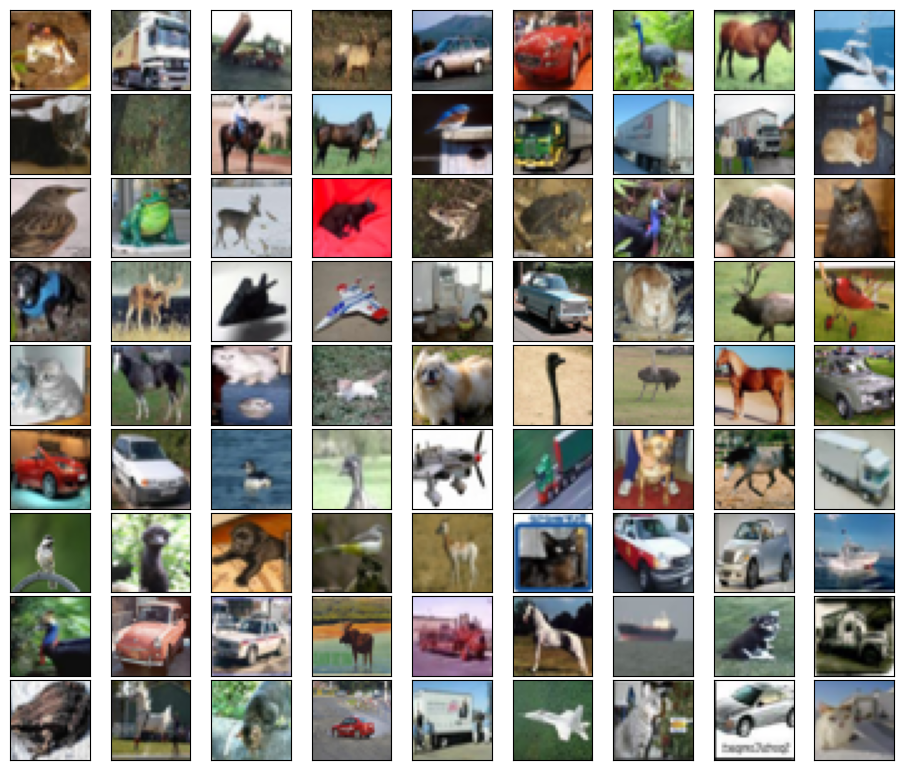

In [4]:
# transforms.Compose: データ拡張で行う処理を順番にまとめておく
transform = transforms.Compose([transforms.RandomHorizontalFlip(p=1.0),  # horizontally flipping
                                transforms.ToTensor()])

dataloader_train_flip = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_flip:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x)
    i += 1
    if i >= 81:
        break

### 2.2. Random rotation
Reference: https://pytorch.org/vision/main/generated/torchvision.transforms.RandomRotation.html

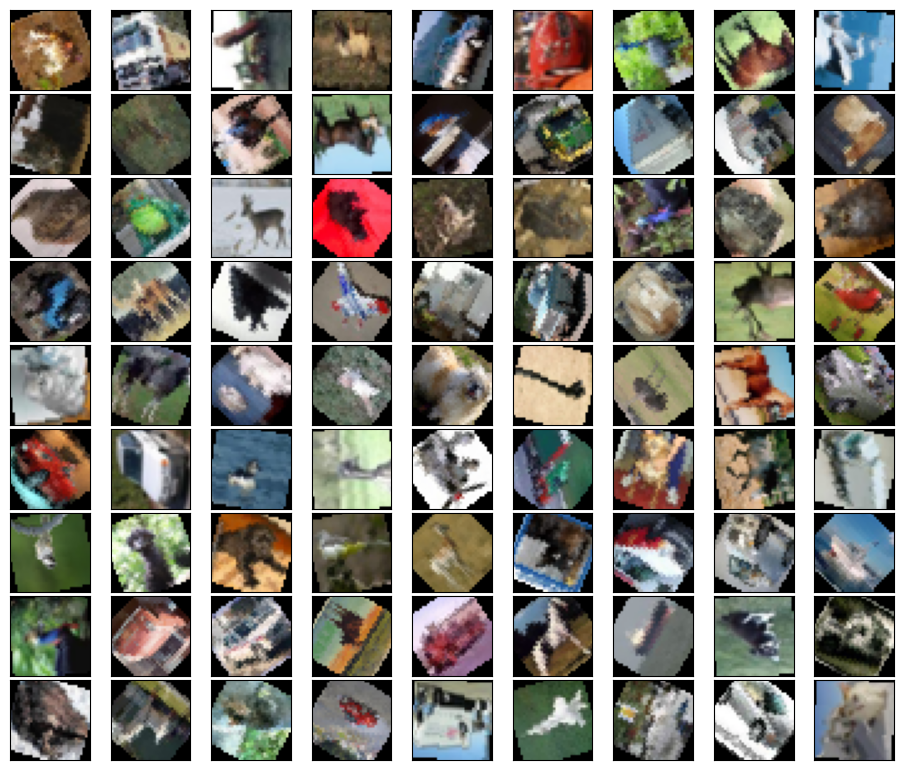

In [5]:
transform = transforms.Compose([transforms.RandomRotation(degrees=(-180, 180)),  # random rotation
                                transforms.ToTensor()])

dataloader_train_flip = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_flip:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x)
    i += 1
    if i >= 81:
        break

### 2.3. Random cropping



Reference: https://pytorch.org/vision/main/generated/torchvision.transforms.RandomCrop.html

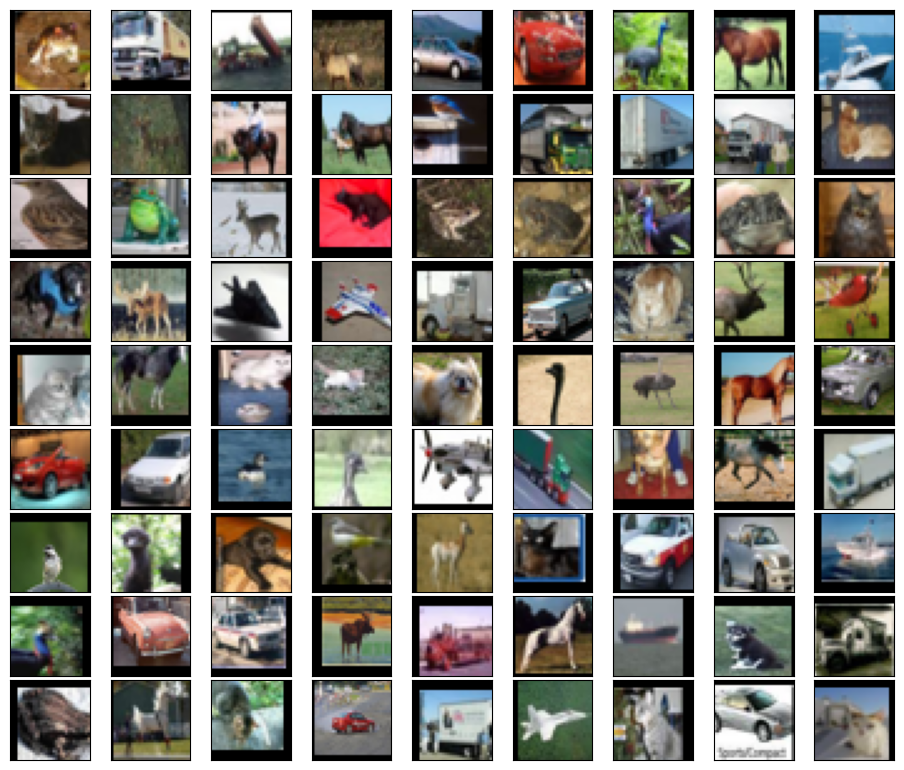

In [6]:
transform = transforms.Compose([transforms.RandomCrop(32, padding=(4, 4, 4, 4), padding_mode='constant'),  # random cropping
                                transforms.ToTensor()])

dataloader_train_crop = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_crop:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x)
    i += 1
    if i >= 81:
        break

### 2.4. Random erasing

- 大きさがランダムの矩形領域で画像をマスクする方法

- 必要なハイパーパラメータ
    - Random erasingを適用する確率(p)
    - 画像全体に対するマスク領域の面積比の最小・最大(scale)
    - マスク領域の縦横比(ratio)

Reference: https://pytorch.org/vision/main/generated/torchvision.transforms.RandomErasing.html

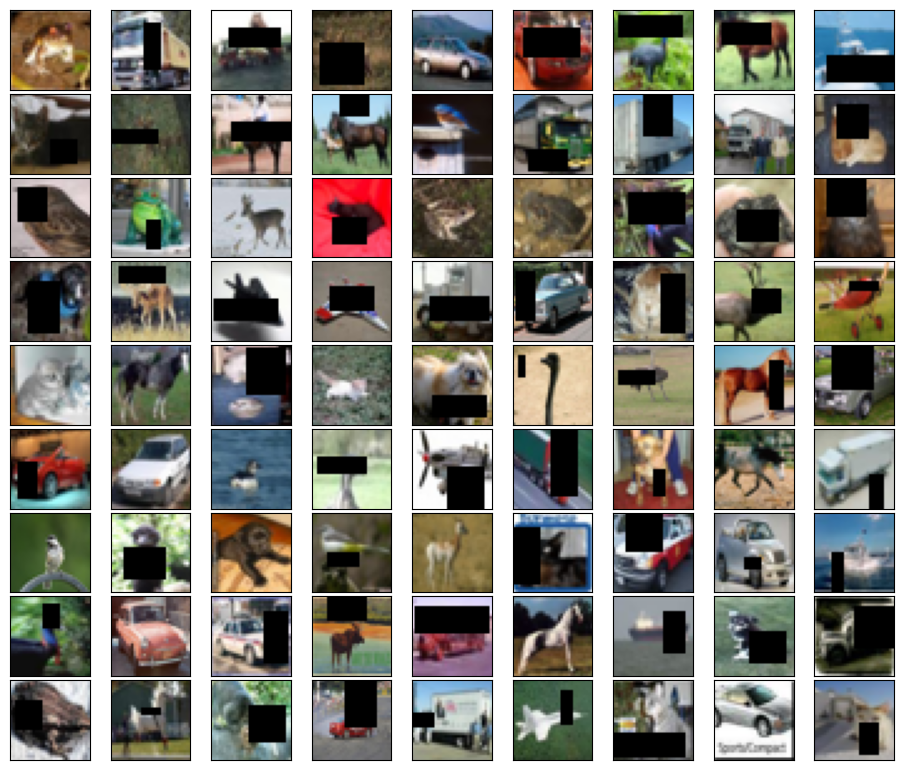

In [7]:
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.RandomErasing(p=0.8, scale=(0.02, 0.33), ratio=(0.3, 3.3)),]) # random erasing

dataloader_train_crop = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_crop:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x)
    i += 1
    if i >= 81:
        break

### 2.5. Brightness, Contrast, Saturation

- Brightnessは画像の輝度，Contrastは画像内の明暗の差，Saturationは画像に含まれる色の「量」と考えることができる
- ピクセル位置ではなく，ピクセル値を変更することから特にColor Augmentationとも呼ばれる
- ColorJitterは，画像の明るさ，コントラスト，彩度，色相をランダムに変化させる方法
- 画像分類タスクやSelf-supervised learningなどに広く使用される

Reference: https://pytorch.org/vision/main/generated/torchvision.transforms.ColorJitter.html

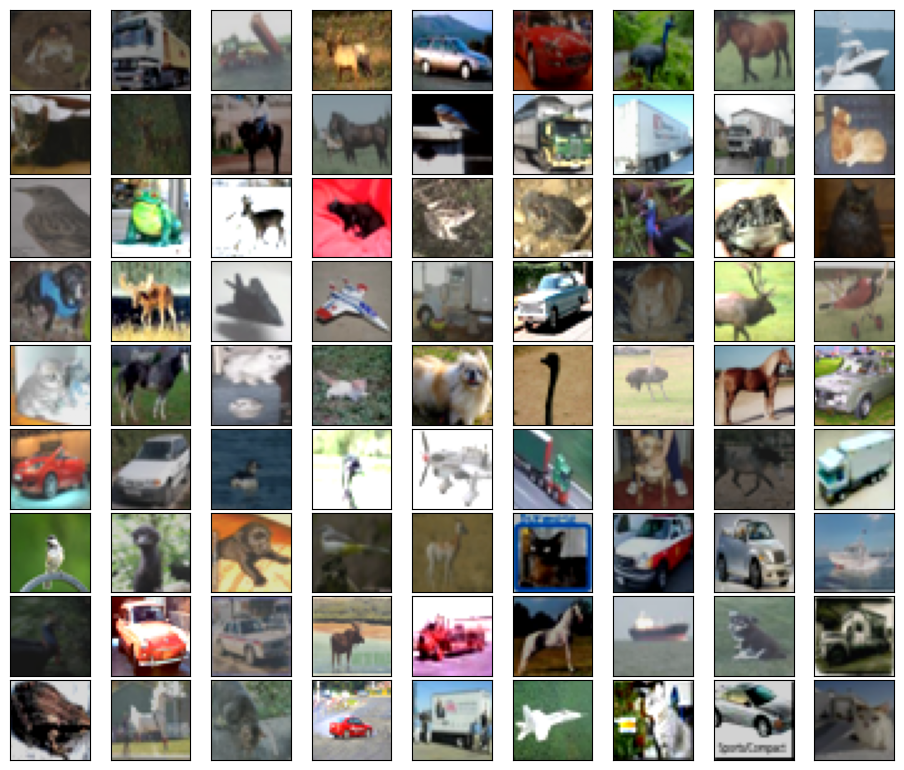

In [8]:
transform = transforms.Compose([transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
                                transforms.ToTensor()])

dataloader_train_crop = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_crop:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x)
    i += 1
    if i >= 81:
        break

### 2.6. Mixup

- Mixupは，2つの画像をλと1-λの重みで混合する方法
- λはパラメータαを持つ対称ベータ分布から生成され，これにより新たな仮想学習サンプルが生成される


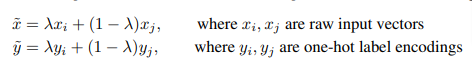

（図の出典：Mixup original paper: https://arxiv.org/pdf/1710.09412.pdf
）

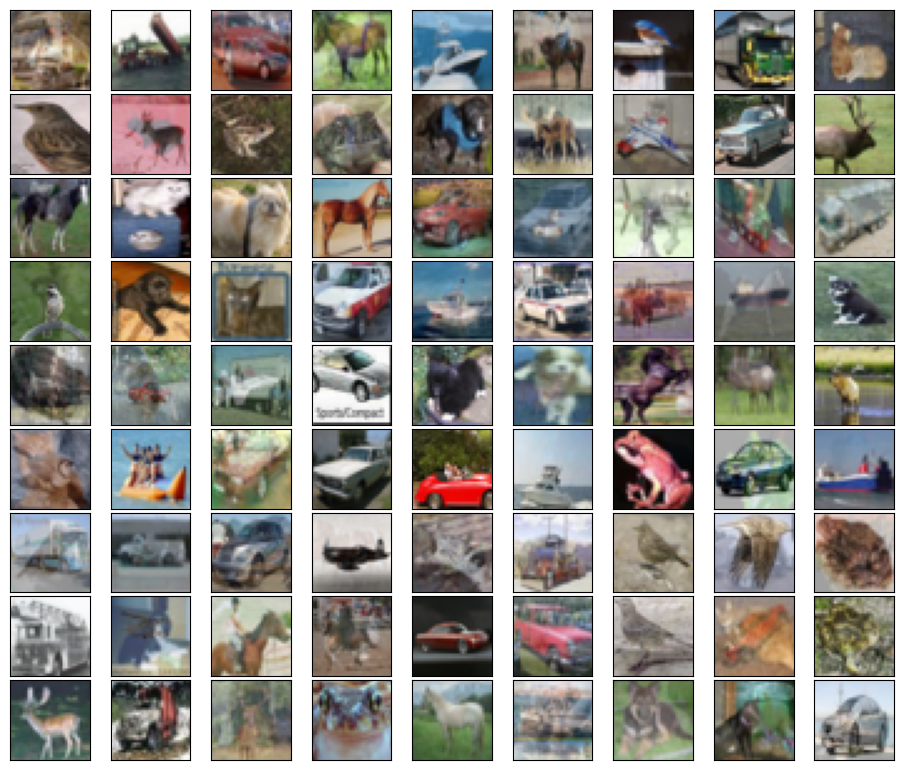

In [9]:
"""
@article{
zhang2018mixup,
title={mixup: Beyond Empirical Risk Minimization},
author={Hongyi Zhang, Moustapha Cisse, Yann N. Dauphin, David Lopez-Paz},
journal={International Conference on Learning Representations},
year={2018},
url={https://openreview.net/forum?id=r1Ddp1-Rb},
}
"""
def mixup_data(x, y, alpha=1.0, use_cuda=True):
    """
    Arguments
    ---------
    x : torch.Tensor
        入力データ．(B, C, H, W)
    y : torch.Tensor
        教師ラベル．(B, num_classes)
    alpha : float
        lambdaをサンプリングするベータ分布のパラメータ．
    use_cuda : bool
        計算時にGPUを利用するかどうか決定するフラグ．

    Returns
    -------
    mixed_x : torch.Tensor
        Mixupで組み合わせた画像．
    mixed_y : torch.Tensor
        Mixupで組み合わせた教師ラベル．
    """
    batch_size = x.size()[0]

    # λをβ分布から生成
    lam = torch.tensor(np.random.beta(alpha, alpha, size=batch_size)).reshape(-1, 1, 1, 1)

    # 受け取ったバッチに対して，今回は一つずらして足し合わせる
    index = [i+1 for i in range(batch_size - 1)] + [0]
    if use_cuda:
        index = torch.tensor(index).cuda()
    else:
        index = torch.tensor(index)

    # 上記の式に従って，画像を重み付き和で組み合わせる
    mixed_x = lam * x + (1 - lam) * x[index]  # 画像
    mixed_y = lam * y + (1 - lam) * y[index]  # 教師ラベル
    return mixed_x, mixed_y, lam

transform = transforms.Compose([transforms.ToTensor(),])

# 今回は簡単のため，バッチサイズ2で行う
dataloader_train_crop = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform),
    batch_size=2,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, t in dataloader_train_crop:
    t = nn.functional.one_hot(t, num_classes=10)
    x, mixed_y, _ = mixup_data(x, t, alpha=1.0, use_cuda=False)
    # バッチの内の一つ目の画像を表示
    x1 = np.transpose(torch.squeeze(x[0]).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(x1)
    i+=1
    if i >= 81:
        break

## 3. Preprocessing

- Global Contrast Normalization (GCN)
- ZCA Whitening

### 3.1. Global Contrast Normalization (GCN)

$$ {\bf x}^{norm} = \frac{{\bf x} - \bar{{\bf x}}}{\sqrt{\sigma_{{\bf x}}}} $$

- 通常の標準化とは違い，画像ごとに行う
- 可視化した際は（可視化に際してスケールを[0,1]化しているので）見た目に変化はない．

In [10]:
# 既存のGCNクラスは存在しないので，自作する.
class gcn():
    def __init__(self):
        pass

    def __call__(self, x):
        mean = torch.mean(x)
        std = torch.std(x)
        return (x - mean)/(std + 10**(-6))  # 0除算を防ぐ


# 標準化後の画像を[0, 1]に正規化する
def deprocess(x):
    """
    Argument
    --------
    x : np.ndarray
        入力画像．(H, W, C)

    Return
    ------
    _x : np.ndarray
        [0, 1]で正規化した画像．(H, W, C)
    """
    _min = np.min(x)
    _max = np.max(x)
    _x = (x - _min)/(_max - _min)
    return _x

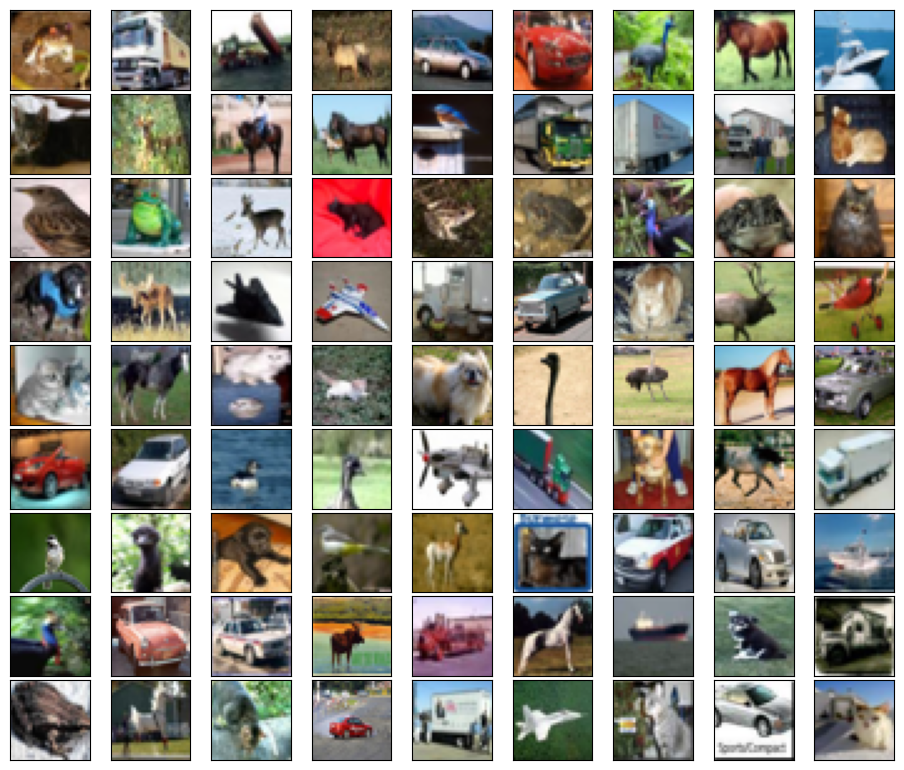

In [11]:
GCN = gcn()
transform_GCN = transforms.Compose([transforms.ToTensor(),
                                    GCN])  # PyTorchのTensor型にしてからGCNの処理をする

dataloader_train_gcn = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform_GCN),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_gcn:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(deprocess(x))
    i += 1
    if i >= 81:
        break

### 3.2. Zero-phase Component Analysis (ZCA) Whitening

$$ {\bf x}^{ZCA} = A(\Lambda + \epsilon I)^{-\frac{1}{2}} A^{\mathrm{T}} ({\bf x} - \bar{\bf x}) $$

- torch.linalg.eigh(対称行列用の固有値分解)を用いてZCAを実装している。

In [12]:
# ZCA白色化の実装
class ZCAWhitening():
    def __init__(self, epsilon=1e-4, device="cuda"):  # 計算が重いのでGPUを用いる
        self.epsilon = epsilon
        self.device = device

    def fit(self, images):  # 変換行列と平均をデータから計算
        """
        Argument
        --------
        images : torchvision.datasets.cifar.CIFAR10
            入力画像（訓練データ全体）．(N, C, H, W)
        """
        x = images[0][0].reshape(1, -1)  # 画像（1枚）を1次元化
        self.mean = torch.zeros([1, x.size()[1]]).to(self.device)  # 平均値を格納するテンソル．xと同じ形状
        con_matrix = torch.zeros([x.size()[1], x.size()[1]]).to(self.device)
        for i in range(len(images)):  # 各データについての平均を取る
            x = images[i][0].reshape(1, -1).to(self.device)
            self.mean += x / len(images)
            con_matrix += torch.mm(x.t(), x) / len(images)
            if i % 10000 == 0:
                print("{0}/{1}".format(i, len(images)))
        con_matrix -= torch.mm(self.mean.t(), self.mean)
        # E: 固有値 V: 固有ベクトルを並べたもの
        E, V = torch.linalg.eigh(con_matrix)  # 固有値分解
        self.ZCA_matrix = torch.mm(torch.mm(V, torch.diag((E.squeeze()+self.epsilon)**(-0.5))), V.t())  # A(\Lambda + \epsilon I)^{1/2}A^T
        print("completed!")

    def __call__(self, x):
        size = x.size()
        x = x.reshape(1, -1).to(self.device)
        x -= self.mean  # x - \bar{x}
        x = torch.mm(x, self.ZCA_matrix.t())
        x = x.reshape(tuple(size))
        x = x.to("cpu")
        return x

In [13]:
zca = ZCAWhitening()
images = datasets.CIFAR10('./data/cifar10', train=True, transform=transforms.ToTensor())
zca.fit(images)

0/50000
10000/50000
20000/50000
30000/50000


KeyboardInterrupt: 

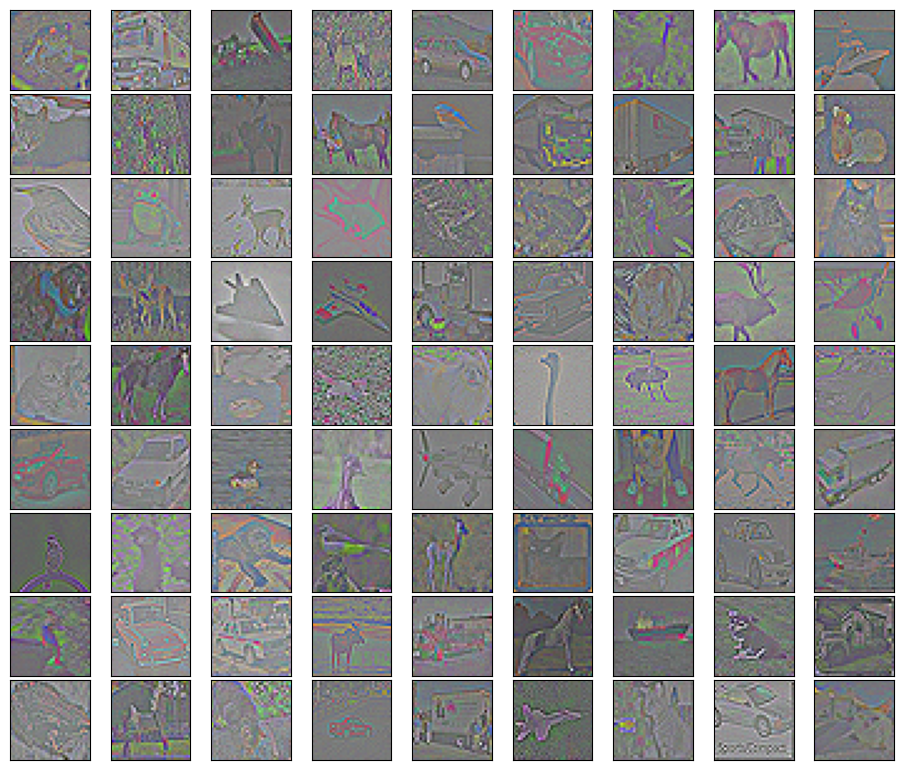

In [ ]:
transform_zca = transforms.Compose([transforms.ToTensor(),
                                    zca])

dataloader_train_zca = torch.utils.data.DataLoader(
    datasets.CIFAR10('./data/cifar10', train=True, transform=transform_zca),
    batch_size=batch_size,
    shuffle=False
)

fig = plt.figure(figsize=(9, 15))
fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05,
                    wspace=0.05)

i = 0
for x, _ in dataloader_train_zca:
    x = np.transpose(torch.squeeze(x).numpy(), (1, 2, 0))
    ax = fig.add_subplot(9, 9, i + 1, xticks=[], yticks=[])
    ax.imshow(deprocess(x))
    i += 1
    if i >= 81:
        break

## 4. Batch Normalization

- 1ミニバッチ内の全データの同一チャネルをそれぞれ正規化する方法です．
- 深層学習において表現力の高さを保ちつつ，学習の収束の高速化と安定化に寄与します．

![](https://standardfrancis.files.wordpress.com/2015/04/screenshot-from-2015-04-16-133436.png?w=1008)

（図の出典: http://proceedings.mlr.press/v37/ioffe15.html ）

In [ ]:
class BatchNorm(nn.Module):
    def __init__(self, shape, epsilon=np.float32(1e-5)):
        super().__init__()
        self.gamma = nn.Parameter(torch.tensor(np.ones(shape, dtype='float32')))
        self.beta = nn.Parameter(torch.tensor(np.zeros(shape, dtype='float32')))
        self.epsilon = epsilon

    def forward(self, x):
        mean = torch.mean(x, (0, 2, 3), keepdim=True)  # WRITE ME
        std = torch.std(x, (0, 2, 3), keepdim=True)  # WRITE ME
        x_normalized = (x - mean) / (std**2 + self.epsilon)**0.5  # WRITE ME
        return self.gamma * x_normalized + self.beta  # WRITE ME

## 5. Dropout

- 過学習を抑制する方法のひとつです．
- Dropoutは特定のレイヤーの出力を学習時にある確率`dropout_ratio`でシャットアウト(0に落とす)ことで，一部のデータが欠損していても正しく認識ができるようにします．
- これにより，画像の一部の局所特徴が過剰に評価されてしまうのを防ぎ，モデルのロバストさを向上させることができます．
- 推論時はすべてのニューロンを使います．そのため，学習時は `1 - dropout_ratio` の割合のニューロンしか使っていないのに，推論時はすべてのニューロンを使ったことによって出力が大きくなってしまうので，出力値に`1 - dropout_ratio`を乗算し，出力の大きさが学習時と同程度になるように調整します．

In [ ]:
class Dropout(nn.Module):
    """
    http://arxiv.org/abs/1207.0580
    """
    def __init__(self, dropout_ratio=0.5):
        super().__init__()
        self.dropout_ratio = dropout_ratio
        self.mask = None

    def forward(self, x):
        # 学習時はdropout_ratio分だけ出力をシャットアウト
        if self.training:
            self.mask = torch.rand(*x.size()) > self.dropout_ratio
            return x * self.mask.to(x.device)
        # 推論時は出力に`1.0 - self.dropout_ratio`を乗算することで学習時の出力の大きさに合わせる
        else:
            return x * (1.0 - self.dropout_ratio)

## 6. 畳み込みニューラルネットワーク(Convolutional Neural Networks)の実装と学習

### 6.1. 各層クラスの実装

#### 畳み込み層

In [ ]:
class Conv(nn.Module):
    def __init__(self, filter_shape, function=lambda x: x, stride=(1, 1), padding=0):
        super().__init__()
        # Heの初期化
        # filter_shape: (出力チャンネル数)x(入力チャンネル数)x(縦の次元数)x(横の次元数)
        fan_in = filter_shape[1] * filter_shape[2] * filter_shape[3]
        fan_out = filter_shape[0] * filter_shape[2] * filter_shape[3]

        self.W = nn.Parameter(torch.tensor(rng.normal(
                        0,
                        np.sqrt(2/fan_in),
                        size=filter_shape
                    ).astype('float32')))

        # バイアスはフィルタごとなので, 出力フィルタ数と同じ次元数
        self.b = nn.Parameter(torch.tensor(np.zeros((filter_shape[0]), dtype='float32')))

        self.function = function  # 活性化関数
        self.stride = stride  # ストライド幅
        self.padding = padding  # パディング

    def forward(self, x):
        u = F.conv2d(x, self.W, bias=self.b, stride=self.stride, padding=self.padding)
        return self.function(u)

#### プーリング層

In [ ]:
class Pooling(nn.Module):
    def __init__(self, ksize=(2, 2), stride=(2, 2), padding=0):
        super().__init__()
        self.ksize = ksize  # カーネルサイズ
        self.stride = stride  # ストライド幅
        self.padding = padding  # パディング

    def forward(self, x):
        return F.avg_pool2d(x, kernel_size=self.ksize, stride=self.stride, padding=self.padding)

#### 平滑化層（4次元->2次元）

In [ ]:
class Flatten(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return x.view(x.size()[0], -1)

#### 全結合層

In [ ]:
class Dense(nn.Module):
    def __init__(self, in_dim, out_dim, function=lambda x: x):
        super().__init__()
        # Heの初期化
        # in_dim: 入力の次元数，out_dim: 出力の次元数

        self.W = nn.Parameter(torch.tensor(rng.normal(
                        0,
                        np.sqrt(2/in_dim),
                        size=(in_dim, out_dim)
                    ).astype('float32')))

        self.b = nn.Parameter(torch.tensor(np.zeros([out_dim]).astype('float32')))
        self.function = function

    def forward(self, x):
        return self.function(torch.matmul(x, self.W) + self.b)

#### 活性化層

In [ ]:
class Activation(nn.Module):
    def __init__(self, function=lambda x: x):
        super().__init__()
        self.function = function

    def __call__(self, x):
        return self.function(x)

### 6.2. ネットワークの構築&データローダーの定義

In [ ]:
# torch.log(0)によるnanを防ぐ
def torch_log(x):
    return torch.log(torch.clamp(x, min=1e-10))

In [ ]:
# ネットワークの定義
# WRITE ME(入出力の画像サイズ）のヒント: 特徴マップの幅，高さは((H - f + 2p) / s )+ 1
# H: 入力画像の幅，もしくは高さ f: フィルターの大きさ（幅方向，もしくは高さ方向） p: パディングサイズ s: ストライド幅
conv_net = nn.Sequential(
    Conv((32, 3, 3, 3)),        # 画像の大きさ：32x32x3 -> 30x30x32  # WRITE ME(入出力の画像サイズ）
    BatchNorm((32, 30, 30)),
    Activation(F.relu),
    Pooling((2, 2)),            # 30x30x32 -> 15x15x32  # WRITE ME(入出力の画像サイズ）
    Conv((64, 32, 3, 3)),       # 15x15x32 -> 13x13x64  # WRITE ME(入出力の画像サイズ）
    BatchNorm((64, 13, 13)),
    Activation(F.relu),
    Pooling((2, 2)),            # 13x13x64 -> 6x6x64  # WRITE ME(入出力の画像サイズ）
    Conv((128, 64, 3, 3)),      # 6x6x64 -> 4x4x128  # WRITE ME(入出力の画像サイズ）
    BatchNorm((128, 4, 4)),
    Activation(F.relu),
    Pooling((2, 2)),            # 4x4x128 -> 2x2x128  # WRITE ME(入出力の画像サイズ）
    Flatten(),
    Dense(2*2*128, 256, F.relu),  # WRITE ME(in_features)
    Dense(256, 10)
)


batch_size = 100
n_epochs = 10
lr = 0.01
device = 'cuda'

conv_net.to(device)
optimizer = optim.Adam(conv_net.parameters(), lr=lr)

In [ ]:
trainval_dataset = datasets.CIFAR10('./data/cifar10', train=True, transform=transforms.ToTensor())

#zcaを定義
zca = ZCAWhitening()
zca.fit(trainval_dataset)

# 前処理を定義
transform = transforms.Compose([transforms.ToTensor(),
                                zca])

trainval_dataset = datasets.CIFAR10('./data/cifar10', train=True, transform=transform)

# trainとvalidに分割
train_dataset, val_dataset = torch.utils.data.random_split(trainval_dataset, [len(trainval_dataset)-10000, 10000])

dataloader_train = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

dataloader_valid = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True
)

print("Train data number:{}, Valid data number: {}".format(len(train_dataset), len(val_dataset)))

0/50000
10000/50000
20000/50000
30000/50000
40000/50000
completed!
Train data number:40000, Valid data number: 10000


### 6.3. 学習

In [ ]:
for epoch in range(n_epochs):
    losses_train = []  # 訓練誤差を格納しておくリスト
    losses_valid = []  # 検証データの誤差を格納しておくリスト

    conv_net.train()  # 訓練モードにする
    n_train = 0  # 訓練データ数
    acc_train = 0  # 訓練データに対する精度
    for x, t in dataloader_train:
        n_train += t.size()[0]

        conv_net.zero_grad()  # 勾配の初期化

        x = x.to(device)  # テンソルをGPUに移動

        t_hot = torch.eye(10)[t]  # 正解ラベルをone-hot vector化

        t = t.to(device)
        t_hot = t_hot.to(device)  # 正解ラベルとone-hot vectorをそれぞれGPUに移動

        y = conv_net.forward(x)  # 順伝播

        loss = -(t_hot*torch.log_softmax(y, dim=-1)).sum(axis=1).mean()  # 誤差(クロスエントロピー誤差関数)の計算

        loss.backward()  # 誤差の逆伝播

        optimizer.step()  # パラメータの更新

        pred = y.argmax(1)  # 最大値を取るラベルを予測ラベルとする

        acc_train += (pred == t).float().sum().item()
        losses_train.append(loss.tolist())

    conv_net.eval()  # 評価モードにする
    n_val = 0
    acc_val = 0
    for x, t in dataloader_valid:
        n_val += t.size()[0]

        x = x.to(device)  # テンソルをGPUに移動

        t_hot = torch.eye(10)[t]  # 正解ラベルをone-hot vector化

        t = t.to(device)
        t_hot = t_hot.to(device)  # 正解ラベルとone-hot vectorをそれぞれGPUに移動

        y = conv_net.forward(x)  # 順伝播

        loss = -(t_hot*torch.log_softmax(y, dim=-1)).sum(axis=1).mean()  # 誤差(クロスエントロピー誤差関数)の計算

        pred = y.argmax(1)  # 最大値を取るラベルを予測ラベルとする

        acc_val += (pred == t).float().sum().item()
        losses_valid.append(loss.tolist())

    print('EPOCH: {}, Train [Loss: {:.3f}, Accuracy: {:.3f}], Valid [Loss: {:.3f}, Accuracy: {:.3f}]'.format(
        epoch,
        np.mean(losses_train),
        acc_train/n_train,
        np.mean(losses_valid),
        acc_val/n_val
    ))

EPOCH: 0, Train [Loss: 1.393, Accuracy: 0.504], Valid [Loss: 1.085, Accuracy: 0.619]
EPOCH: 1, Train [Loss: 0.872, Accuracy: 0.695], Valid [Loss: 0.830, Accuracy: 0.715]
EPOCH: 2, Train [Loss: 0.695, Accuracy: 0.758], Valid [Loss: 0.833, Accuracy: 0.716]
EPOCH: 3, Train [Loss: 0.573, Accuracy: 0.799], Valid [Loss: 0.786, Accuracy: 0.735]
EPOCH: 4, Train [Loss: 0.493, Accuracy: 0.828], Valid [Loss: 0.812, Accuracy: 0.741]
EPOCH: 5, Train [Loss: 0.426, Accuracy: 0.851], Valid [Loss: 0.828, Accuracy: 0.738]
EPOCH: 6, Train [Loss: 0.362, Accuracy: 0.873], Valid [Loss: 0.887, Accuracy: 0.741]
EPOCH: 7, Train [Loss: 0.313, Accuracy: 0.891], Valid [Loss: 0.871, Accuracy: 0.740]
EPOCH: 8, Train [Loss: 0.273, Accuracy: 0.905], Valid [Loss: 0.962, Accuracy: 0.739]
EPOCH: 9, Train [Loss: 0.232, Accuracy: 0.917], Valid [Loss: 1.044, Accuracy: 0.737]


## 7. Activationの可視化

- 各畳み込み層の特徴マップを可視化

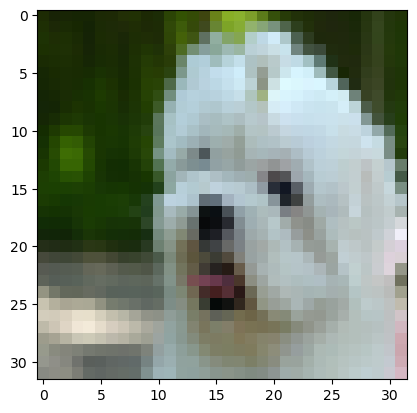

In [ ]:
trainval = datasets.CIFAR10('./data/cifar10')
image_id = 919  # 表示させる画像を選択
sample_image = trainval[image_id][0]
plt.imshow(sample_image)

In [ ]:
def feature_map(image, output_layer):  # output_layer番目の層の特徴マップを出力する関数
    """
    Argumnets
    ---------
    image : torch.Tensor
        入力画像．(C, H, W)
    output_layer : int
        表示したい特徴マップを出力する層の番号．

    Return
    ------
    image : torch.Tensor
        引数で設定した層から出力される特徴マップ．
    """
    image = transform(image)
    image = conv_net[0:output_layer + 1](image.unsqueeze(0).to(device))
    return image


print("ネットワークの構造")
print(conv_net)

ネットワークの構造
Sequential(
  (0): Conv()
  (1): BatchNorm()
  (2): Activation()
  (3): Pooling()
  (4): Conv()
  (5): BatchNorm()
  (6): Activation()
  (7): Pooling()
  (8): Conv()
  (9): BatchNorm()
  (10): Activation()
  (11): Pooling()
  (12): Flatten()
  (13): Dense()
  (14): Dense()
)


### 7.1. conv_1

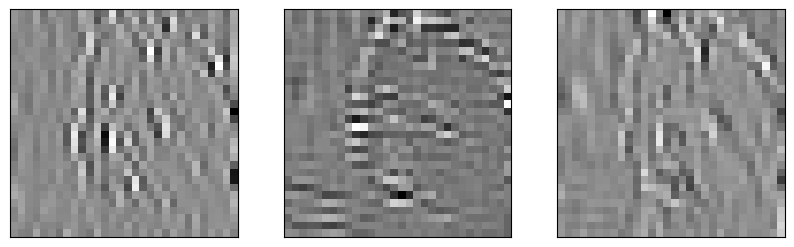

In [ ]:
_output = feature_map(sample_image, 0).to("cpu")
fig = plt.figure(figsize=(10, 10))
_output = np.transpose(torch.squeeze(_output).detach().numpy(), (1, 2, 0))
for i in range(3):
    ax = fig.add_subplot(1, 3, i+1, xticks=[], yticks=[])
    ax.imshow(deprocess(_output[:, :, i]), cmap='gray')

### 7.2. conv_2

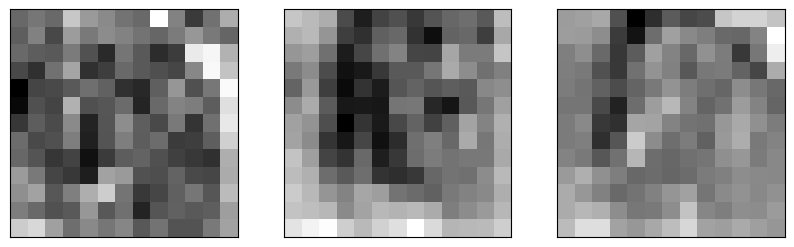

In [ ]:
_output = feature_map(sample_image, 4).to("cpu")
fig = plt.figure(figsize=(10, 10))
_output = np.transpose(torch.squeeze(_output).detach().numpy(), (1, 2, 0))
for i in range(3):
    ax = fig.add_subplot(1, 3, i+1, xticks=[], yticks=[])
    ax.imshow(deprocess(_output[:, :, i]), cmap='gray')

### 7.3. conv_3

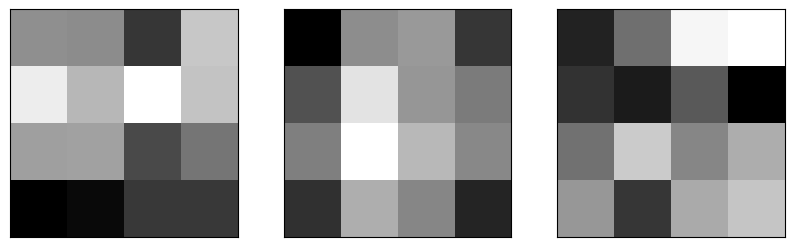

In [ ]:
_output = feature_map(sample_image, 8).to("cpu")
fig = plt.figure(figsize=(10, 10))
_output = np.transpose(torch.squeeze(_output).detach().numpy(), (1, 2, 0))
for i in range(3):
    ax = fig.add_subplot(1, 3, i+1, xticks=[], yticks=[])
    ax.imshow(deprocess(_output[:, :, i]), cmap='gray')

学習後の特徴マップの性質として，浅い層はエッジなどの簡単な表現，深い層になるほど複雑な表現を獲得することが知られています．

参考: https://www.iro.umontreal.ca/~bengioy/talks/DL-Tutorial-NIPS2015.pdf (p.34)




## 8. torch.nn に含まれるlayer, Loss関数の利用

In [ ]:
conv_net2 = nn.Sequential(
    nn.Conv2d(3, 32, 3),              # 32x32x3 -> 30x30x32
    nn.BatchNorm2d(32),
    nn.ReLU(),
    nn.AvgPool2d(2),                  # 30x30x32 -> 15x15x32
    nn.Conv2d(32, 64, 3),             # 15x15x32 -> 13x13x64
    nn.BatchNorm2d(64),
    nn.ReLU(),
    nn.AvgPool2d(2),                  # 13x13x64 -> 6x6x64
    nn.Conv2d(64, 128, 3),            # 6x6x64 -> 4x4x128
    nn.BatchNorm2d(128),
    nn.ReLU(),
    nn.AvgPool2d(2),                  # 4x4x128 -> 2x2x128
    nn.Flatten(),
    nn.Linear(2*2*128, 256),
    nn.ReLU(),
    nn.Linear(256, 10)
)


def init_weights(m):  # Heの初期化
    if type(m) == nn.Linear or type(m) == nn.Conv2d:
        torch.nn.init.kaiming_normal_(m.weight)
        m.bias.data.fill_(0.0)


conv_net2.apply(init_weights)

batch_size = 100
n_epochs = 5
lr = 0.01
device = 'cuda'

conv_net2.to(device)
optimizer2 = optim.Adam(conv_net2.parameters(), lr=lr)
loss_function = nn.CrossEntropyLoss()  # nn.ClossEntropyLossは，出力のsoftmax変換と，正解ラベルのone-hot vector化の機能を持っている

データの読み込み

In [ ]:
trainval_dataset = datasets.CIFAR10('./data/cifar10', train=True, transform=transforms.ToTensor())

#zcaを定義
zca = ZCAWhitening()
zca.fit(trainval_dataset)

# 前処理を定義
transform = transforms.Compose([transforms.ToTensor(),
                                zca])

trainval_dataset = datasets.CIFAR10('./data/cifar10', train=True, transform=transform)

# trainとvalidに分割
train_dataset, val_dataset = torch.utils.data.random_split(trainval_dataset, [len(trainval_dataset)-10000, 10000])

dataloader_train = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

dataloader_valid = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True
)

0/50000
10000/50000
20000/50000
30000/50000
40000/50000
completed!


### 8.2. 学習

In [ ]:
for epoch in range(n_epochs):
    losses_train = []
    losses_valid = []

    conv_net2.train()
    n_train = 0
    acc_train = 0
    for x, t in dataloader_train:
        n_train += t.size()[0]

        conv_net2.zero_grad()  # 勾配の初期化

        x = x.to(device)  # テンソルをGPUに移動
        t = t.to(device)

        y = conv_net2.forward(x)  # 順伝播

        loss = loss_function(y, t)  # 誤差(クロスエントロピー誤差関数)の計算

        loss.backward()  # 誤差の逆伝播

        optimizer2.step()  # パラメータの更新

        pred = y.argmax(1)  # 最大値を取るラベルを予測ラベルとする

        acc_train += (pred == t).float().sum().item()
        losses_train.append(loss.tolist())

    conv_net2.eval()
    n_val = 0
    acc_val = 0
    for x, t in dataloader_valid:
        n_val += t.size()[0]

        x = x.to(device)  # テンソルをGPUに移動
        t = t.to(device)

        y = conv_net2.forward(x)  # 順伝播

        loss = loss_function(y, t)  # 誤差(クロスエントロピー誤差関数)の計算

        pred = y.argmax(1)  # 最大値を取るラベルを予測ラベルとする

        acc_val += (pred == t).float().sum().item()
        losses_valid.append(loss.tolist())

    print('EPOCH: {}, Train [Loss: {:.3f}, Accuracy: {:.3f}], Valid [Loss: {:.3f}, Accuracy: {:.3f}]'.format(
        epoch,
        np.mean(losses_train),
        acc_train/n_train,
        np.mean(losses_valid),
        acc_val/n_val
    ))

EPOCH: 0, Train [Loss: 1.325, Accuracy: 0.533], Valid [Loss: 1.242, Accuracy: 0.567]
EPOCH: 1, Train [Loss: 0.839, Accuracy: 0.708], Valid [Loss: 0.902, Accuracy: 0.684]
EPOCH: 2, Train [Loss: 0.685, Accuracy: 0.765], Valid [Loss: 1.011, Accuracy: 0.666]
EPOCH: 3, Train [Loss: 0.582, Accuracy: 0.799], Valid [Loss: 0.697, Accuracy: 0.762]
EPOCH: 4, Train [Loss: 0.512, Accuracy: 0.822], Valid [Loss: 0.724, Accuracy: 0.753]
